In [1]:
import os
from pathlib import Path

import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

from PIL import Image

In [2]:
dataset_path = Path("../dataset/raw/Indian_Food_Dataset")

print("Dataset path:", dataset_path)

food_classes = sorted([
    folder.name 
    for folder in dataset_path.iterdir() 
    if folder.is_dir()
])

print("Number of classes:", len(food_classes))
print("Food classes:", food_classes)

Dataset path: ..\dataset\raw\Indian_Food_Dataset
Number of classes: 20
Food classes: ['Aloo_matar', 'Besan_cheela', 'Biryani', 'Chapathi', 'Chole_bature', 'Dahl', 'Dhokla', 'Dosa', 'Gulab_jamun', 'Idli', 'Jalebi', 'Kadai_paneer', 'Naan', 'Paani_puri', 'Pakoda', 'Pav_bhaji', 'Poha', 'Rolls', 'Samosa', 'Vada_pav']


In [3]:
img_count = []

for food in food_classes:
    food_folder = dataset_path / food
    num_images = len(list(food_folder.glob("*")))
    img_count.append(num_images)

df = pd.DataFrame({
    "Food": food_classes,
    "Images": img_count
})

df

,Food,Images
0,Aloo_matar,47
1,Besan_cheela,296
2,Biryani,278
3,Chapathi,775
4,Chole_bature,1221
5,Dahl,729
6,Dhokla,467
7,Dosa,512
8,Gulab_jamun,235
9,Idli,695


In [4]:
print("Class with maximum images:")
print(df.loc[df["Images"].idxmax()])

print("\nClass with minimum images:")
print(df.loc[df["Images"].idxmin()])

print("\nTotal images:", df["Images"].sum())
print("Average images per class:", df["Images"].mean())

Class with maximum images:
Food      Chole_bature
Images            1221
Name: 4, dtype: object

Class with minimum images:
Food      Aloo_matar
Images            47
Name: 0, dtype: object

Total images: 11274
Average images per class: 563.7


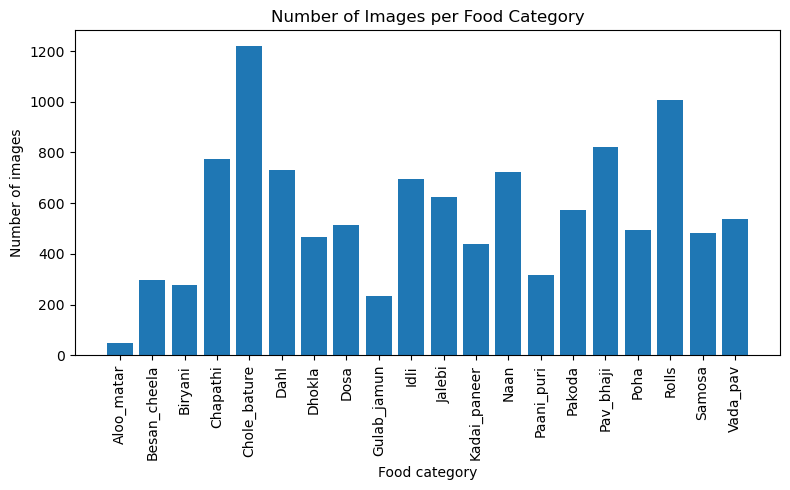

In [5]:
plt.figure(figsize=(8, 5))

plt.bar(df["Food"], df["Images"])

plt.xticks(rotation=90)
plt.xlabel("Food category")
plt.ylabel("Number of images")
plt.title("Number of Images per Food Category")

plt.tight_layout()
plt.show()

In [6]:
corrupted_images = []

for food in food_classes:
    food_folder = dataset_path / food
    image_files = list(food_folder.glob("*"))

    for image_path in image_files:
        try:
            image = Image.open(image_path)
            image.verify()
        except:
            corrupted_images.append(image_path)

print("Corrupted images:", len(corrupted_images))

Corrupted images: 0


In [7]:
from collections import Counter

image_sizes = Counter()

for food in food_classes:
    food_folder = dataset_path / food

    for image_path in food_folder.glob("*"):
        try:
            with Image.open(image_path) as image:
                image_sizes[image.size] += 1
        except:
            pass

print("Number of unique image sizes:", len(image_sizes))
print("Most common image sizes:")

for size, count in image_sizes.most_common(10):
    print(size, ":", count)

Number of unique image sizes: 1989
Most common image sizes:
(300, 300) : 3633
(416, 416) : 1192
(1280, 720) : 224
(256, 256) : 153
(500, 500) : 152
(751, 532) : 103
(1080, 1080) : 103
(183, 275) : 77
(275, 183) : 75
(696, 905) : 73


In [8]:
small_images = []

for food in food_classes:
    food_folder = dataset_path / food

    for image_path in food_folder.glob("*"):
        try:
            with Image.open(image_path) as image:
                width, height = image.size

                if width < 150 or height < 150:
                    small_images.append(
                        (food, image_path, image.size)
                    )

        except:
            pass

print("Number of very small images:", len(small_images))
print(small_images[:10])

Number of very small images: 0
[]


In [9]:
all_images = []
all_labels = []

for food in food_classes:
    food_folder = dataset_path / food

    for image_path in food_folder.glob("*"):
        all_images.append(image_path)
        all_labels.append(food)

print("Total images:", len(all_images))
print("Total labels:", len(all_labels))

Total images: 11274
Total labels: 11274


In [10]:
from sklearn.model_selection import train_test_split

X_train, X_temp, y_train, y_temp = train_test_split(
    all_images,
    all_labels,
    test_size=0.30,
    random_state=42,
    stratify=all_labels
)

X_val, X_test, y_val, y_test = train_test_split(
    X_temp,
    y_temp,
    test_size=0.50,
    random_state=42,
    stratify=y_temp
)

print("Training images:", len(X_train))
print("Validation images:", len(X_val))
print("Test images:", len(X_test))

Training images: 7891
Validation images: 1691
Test images: 1692


In [11]:
from collections import Counter

print("Training distribution:")
print(Counter(y_train))

print("\nValidation distribution:")
print(Counter(y_val))

print("\nTest distribution:")
print(Counter(y_test))

Training distribution:
Counter({'Chole_bature': 855, 'Rolls': 706, 'Pav_bhaji': 575, 'Chapathi': 542, 'Dahl': 510, 'Naan': 507, 'Idli': 486, 'Jalebi': 437, 'Pakoda': 401, 'Vada_pav': 375, 'Dosa': 358, 'Poha': 346, 'Samosa': 338, 'Dhokla': 327, 'Kadai_paneer': 307, 'Paani_puri': 221, 'Besan_cheela': 207, 'Biryani': 195, 'Gulab_jamun': 165, 'Aloo_matar': 33})

Validation distribution:
Counter({'Chole_bature': 183, 'Rolls': 151, 'Pav_bhaji': 123, 'Chapathi': 116, 'Dahl': 109, 'Naan': 108, 'Idli': 104, 'Jalebi': 94, 'Pakoda': 86, 'Vada_pav': 81, 'Dosa': 77, 'Poha': 74, 'Samosa': 73, 'Dhokla': 70, 'Kadai_paneer': 66, 'Paani_puri': 47, 'Besan_cheela': 45, 'Biryani': 42, 'Gulab_jamun': 35, 'Aloo_matar': 7})

Test distribution:
Counter({'Chole_bature': 183, 'Rolls': 151, 'Pav_bhaji': 124, 'Chapathi': 117, 'Dahl': 110, 'Naan': 109, 'Idli': 105, 'Jalebi': 94, 'Pakoda': 86, 'Vada_pav': 80, 'Dosa': 77, 'Poha': 74, 'Samosa': 72, 'Dhokla': 70, 'Kadai_paneer': 66, 'Paani_puri': 47, 'Besan_cheela': 44

In [12]:
class_to_index = {
    food: index 
    for index, food in enumerate(food_classes)
}

print(class_to_index)

{'Aloo_matar': 0, 'Besan_cheela': 1, 'Biryani': 2, 'Chapathi': 3, 'Chole_bature': 4, 'Dahl': 5, 'Dhokla': 6, 'Dosa': 7, 'Gulab_jamun': 8, 'Idli': 9, 'Jalebi': 10, 'Kadai_paneer': 11, 'Naan': 12, 'Paani_puri': 13, 'Pakoda': 14, 'Pav_bhaji': 15, 'Poha': 16, 'Rolls': 17, 'Samosa': 18, 'Vada_pav': 19}


In [13]:
y_train_num = [class_to_index[label] for label in y_train]
y_val_num = [class_to_index[label] for label in y_val]
y_test_num = [class_to_index[label] for label in y_test]

print("First 10 training labels:")
print(y_train_num[:10])

First 10 training labels:
[3, 17, 10, 5, 10, 14, 17, 12, 4, 1]


In [14]:
from tensorflow.keras import layers

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
], name="data_augmentation")

print("Data augmentation pipeline created.")

Data augmentation pipeline created.


In [15]:
from sklearn.utils.class_weight import compute_class_weight

classes = np.unique(y_train_num)

weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=y_train_num
)

class_weights = dict(zip(classes, weights))

print("Class weights:")

for class_index, weight in class_weights.items():
    print(
        food_classes[class_index],
        ":",
        round(weight, 2)
    )

Class weights:
Aloo_matar : 11.96
Besan_cheela : 1.91
Biryani : 2.02
Chapathi : 0.73
Chole_bature : 0.46
Dahl : 0.77
Dhokla : 1.21
Dosa : 1.1
Gulab_jamun : 2.39
Idli : 0.81
Jalebi : 0.9
Kadai_paneer : 1.29
Naan : 0.78
Paani_puri : 1.79
Pakoda : 0.98
Pav_bhaji : 0.69
Poha : 1.14
Rolls : 0.56
Samosa : 1.17
Vada_pav : 1.05


NEW

In [16]:
def load_and_preprocess(image_path, label):
    # Read image
    image = tf.io.read_file(image_path)

    # Decode image
    image = tf.image.decode_image(
        image,
        channels=3,
        expand_animations=False
    )

    # Resize
    image = tf.image.resize(
        image,
        [224, 224]
    )

    # Normalize
    image = tf.cast(image, tf.float32) / 255.0

    # Set known shape
    image.set_shape([224, 224, 3])

    return image, label

In [17]:
test_path = tf.constant(str(X_train[0]))
test_label = tf.constant(y_train_num[0], dtype=tf.int32)

test_image, test_label = load_and_preprocess(
    test_path,
    test_label
)

print("Image shape:", test_image.shape)
print("Label shape:", test_label.shape)
print("Label:", test_label.numpy())

Image shape: (224, 224, 3)
Label shape: ()
Label: 3


In [18]:
train_dataset = tf.data.Dataset.from_tensor_slices(
    (
        [str(path) for path in X_train],
        y_train_num
    )
)

train_dataset = train_dataset.map(
    load_and_preprocess,
    num_parallel_calls=tf.data.AUTOTUNE
)

train_dataset = train_dataset.shuffle(
    1000,
    reshuffle_each_iteration=True
)

train_dataset = train_dataset.batch(32)

train_dataset = train_dataset.prefetch(
    tf.data.AUTOTUNE
)

print("Training dataset created!")

Training dataset created!


In [19]:
val_dataset = tf.data.Dataset.from_tensor_slices(
    (
        [str(path) for path in X_val],
        y_val_num
    )
)

val_dataset = val_dataset.map(
    load_and_preprocess,
    num_parallel_calls=tf.data.AUTOTUNE
)

val_dataset = val_dataset.batch(32)

val_dataset = val_dataset.prefetch(
    tf.data.AUTOTUNE
)

print("Validation dataset created!")

Validation dataset created!


In [20]:
test_dataset = tf.data.Dataset.from_tensor_slices(
    (
        [str(path) for path in X_test],
        y_test_num
    )
)

test_dataset = test_dataset.map(
    load_and_preprocess,
    num_parallel_calls=tf.data.AUTOTUNE
)

test_dataset = test_dataset.batch(32)

test_dataset = test_dataset.prefetch(
    tf.data.AUTOTUNE
)

print("Test dataset created!")

Test dataset created!


In [21]:
for images, labels in train_dataset.take(1):
    print("Training batch image shape:", images.shape)
    print("Training batch label shape:", labels.shape)

Training batch image shape: (32, 224, 224, 3)
Training batch label shape: (32,)


In [22]:
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights="imagenet"
)

# Freeze the pretrained layers
base_model.trainable = False

print("Pretrained MobileNetV2 loaded successfully!")

Pretrained MobileNetV2 loaded successfully!


In [23]:
from tensorflow.keras import layers

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
], name="data_augmentation")

print("Data augmentation pipeline created successfully!")

Data augmentation pipeline created successfully!


In [24]:
model = tf.keras.Sequential([
    data_augmentation,
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(
        len(food_classes),
        activation="softmax"
    )
])

print("Complete model created successfully!")

Complete model created successfully!


In [25]:
model.compile(
    optimizer="adam",
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

print("Model compiled successfully!")

Model compiled successfully!


In [26]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ data_augmentation (Sequential)       │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ ?                           │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ ?                           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [27]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# Get all unique class numbers
classes = np.unique(y_train_num)

# Calculate balanced class weights
weights = compute_class_weight(
    class_weight="balanced",
    classes=classes,
    y=y_train_num
)

# Convert weights into a dictionary
class_weights = dict(zip(classes, weights))

print("Class weights:")

for class_index, weight in class_weights.items():
    print(
        food_classes[class_index],
        ":",
        round(weight, 2)
    )

Class weights:
Aloo_matar : 11.96
Besan_cheela : 1.91
Biryani : 2.02
Chapathi : 0.73
Chole_bature : 0.46
Dahl : 0.77
Dhokla : 1.21
Dosa : 1.1
Gulab_jamun : 2.39
Idli : 0.81
Jalebi : 0.9
Kadai_paneer : 1.29
Naan : 0.78
Paani_puri : 1.79
Pakoda : 0.98
Pav_bhaji : 0.69
Poha : 1.14
Rolls : 0.56
Samosa : 1.17
Vada_pav : 1.05


In [28]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Stop training if validation loss does not improve
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=3,
    restore_best_weights=True,
    verbose=1
)

# Save the best version of the model
model_checkpoint = ModelCheckpoint(
    "best_food_model.keras",
    monitor="val_loss",
    save_best_only=True,
    verbose=1
)

print("Callbacks created successfully!")

Callbacks created successfully!


In [29]:
print(model)

<Sequential name=sequential, built=False>


In [30]:
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=15,
    class_weight=class_weights,
    callbacks=[
        early_stopping,
        model_checkpoint
    ]
)

Epoch 1/15


D:\ML\Lib\site-packages\keras\src\trainers\epoch_iterator.py:74: UserWarning: `shuffle=True` was passed, but will be ignored since the data `x` was provided as a tf.data.Dataset. The Dataset is expected to already be shuffled (via `.shuffle(buffer_size)`).
  self.data_adapter = data_adapters.get_data_adapter(


247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.6064 - loss: 1.4099
Epoch 1: val_loss improved from None to 0.64856, saving model to best_food_model.keras

Epoch 1: finished saving model to best_food_model.keras
247/247 ━━━━━━━━━━━━━━━━━━━━ 618s 2s/step - accuracy: 0.6064 - loss: 1.4099 - val_accuracy: 0.8167 - val_loss: 0.6486
Epoch 2/15
163/247 ━━━━━━━━━━━━━━━━━━━━ 2:42 2s/step - accuracy: 0.7862 - loss: 0.7352
Epoch 2: val_loss improved from 0.64856 to 0.55603, saving model to best_food_model.keras

Epoch 2: finished saving model to best_food_model.keras
247/247 ━━━━━━━━━━━━━━━━━━━━ 558s 2s/step - accuracy: 0.7920 - loss: 0.7023 - val_accuracy: 0.8279 - val_loss: 0.5560
Epoch 3/15
247/247 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8259 - loss: 0.5740
Epoch 3: val_loss improved from 0.55603 to 0.53211, saving model to best_food_model.keras

Epoch 3: finished saving model to best_food_model.keras
247/247 ━━━━━━━━━━━━━━━━━━━━ 557s 2s/step - accuracy: 0.8259 - loss: 0.5740 - va

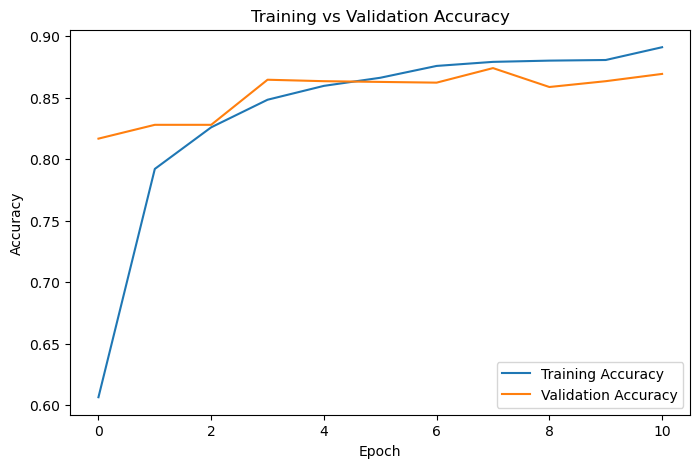

In [31]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))

plt.plot(history.history["accuracy"], label="Training Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")

plt.title("Training vs Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.show()

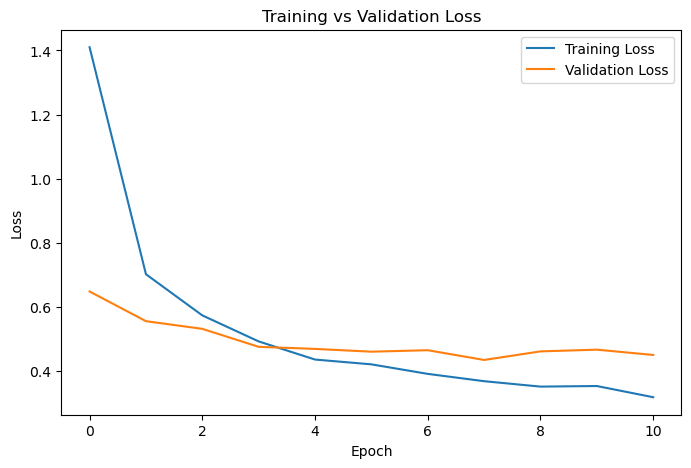

In [32]:
plt.figure(figsize=(8,5))

plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")

plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.show()

In [34]:
test_loss, test_accuracy = model.evaluate(test_dataset)

print("Test Loss:", round(test_loss, 4))
print("Test Accuracy:", round(test_accuracy * 100, 2), "%")

53/53 ━━━━━━━━━━━━━━━━━━━━ 50s 913ms/step - accuracy: 0.8652 - loss: 0.4381
Test Loss: 0.4381
Test Accuracy: 86.52 %


In [35]:
import numpy as np

y_true = []
y_pred = []

for images, labels in test_dataset:

    predictions = model.predict(images, verbose=0)

    predicted_labels = np.argmax(predictions, axis=1)

    y_true.extend(labels.numpy())
    y_pred.extend(predicted_labels)

print("Predictions generated successfully!")

Predictions generated successfully!


In [36]:
from sklearn.metrics import classification_report

print(
    classification_report(
        y_true,
        y_pred,
        target_names=food_classes
    )
)

              precision    recall  f1-score   support

  Aloo_matar       0.20      0.43      0.27         7
Besan_cheela       1.00      0.75      0.86        44
     Biryani       0.78      0.71      0.74        41
    Chapathi       0.95      0.74      0.83       117
Chole_bature       0.90      0.92      0.91       183
        Dahl       0.86      0.85      0.86       110
      Dhokla       0.84      0.94      0.89        70
        Dosa       0.81      0.92      0.86        77
 Gulab_jamun       0.97      0.94      0.96        35
        Idli       0.93      0.95      0.94       105
      Jalebi       0.91      0.95      0.93        94
Kadai_paneer       0.56      0.80      0.66        66
        Naan       0.80      0.91      0.85       109
  Paani_puri       0.82      0.77      0.79        47
      Pakoda       0.91      0.79      0.84        86
   Pav_bhaji       0.89      0.77      0.83       124
        Poha       0.93      0.95      0.94        74
       Rolls       0.94    

<Figure size 1200x1200 with 0 Axes>

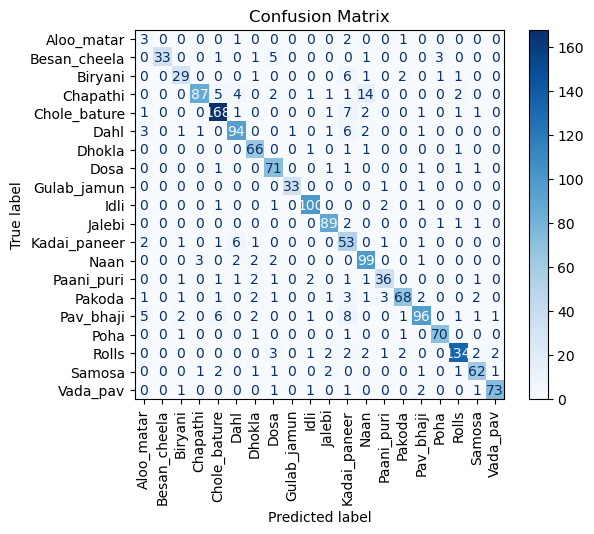

In [37]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(12,12))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=food_classes
)

disp.plot(
    cmap="Blues",
    xticks_rotation=90
)

plt.title("Confusion Matrix")
plt.show()

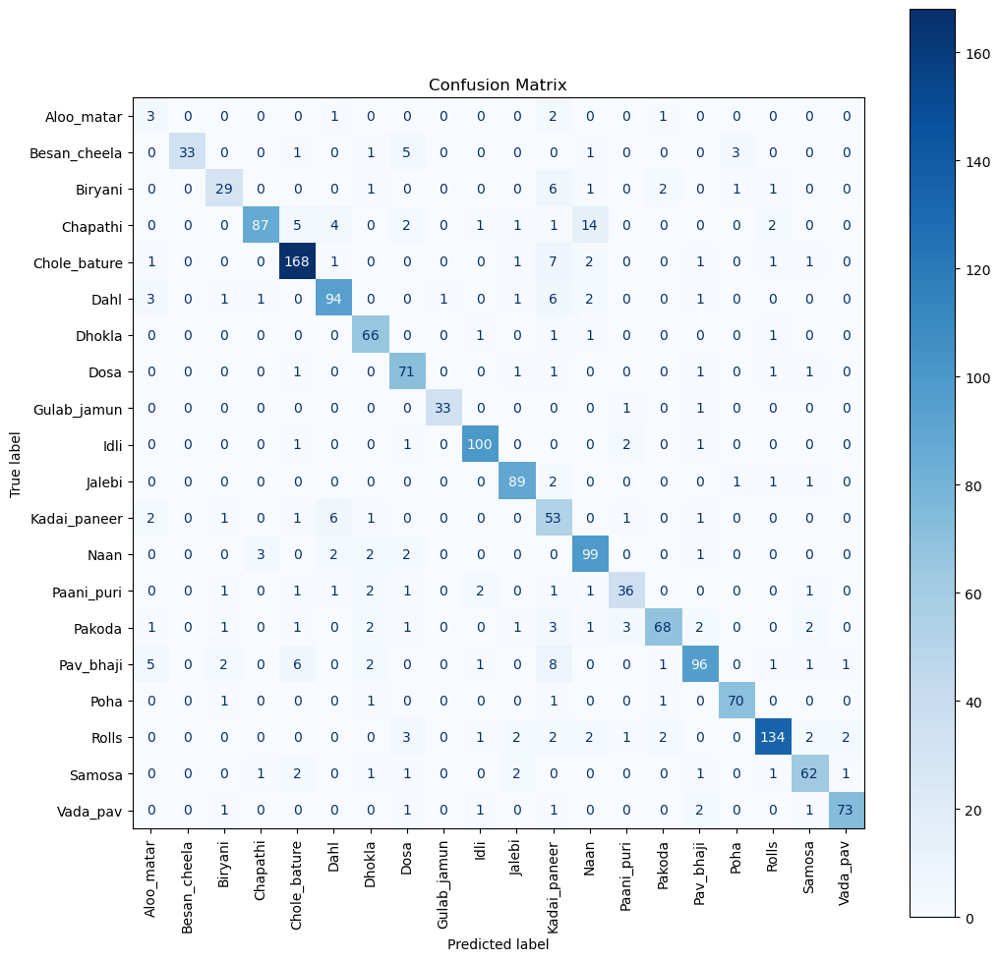

In [38]:
fig, ax = plt.subplots(figsize=(12,12))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=food_classes
)

disp.plot(
    cmap="Blues",
    xticks_rotation=90,
    ax=ax
)

plt.title("Confusion Matrix")

plt.savefig(
    "confusion_matrix.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

FOOD PREDICTION

In [40]:
from tensorflow.keras.models import load_model

model = load_model("best_food_model.keras")

print("Model loaded successfully!")

Model loaded successfully!


In [41]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def predict_food(image_path):

    image = Image.open(image_path).convert("RGB")

    image = image.resize((224,224))

    image_array = np.array(image) / 255.0

    image_array = np.expand_dims(image_array, axis=0)

    prediction = model.predict(image_array, verbose=0)

    predicted_class = np.argmax(prediction)

    confidence = np.max(prediction)

    food_name = food_classes[predicted_class]

    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Prediction: {food_name}")

    plt.show()

    print(f"Predicted Food : {food_name}")
    print(f"Confidence     : {confidence*100:.2f}%")

    return food_name

..\dataset\raw\Indian_Food_Dataset\Biryani\00000000_resized.png


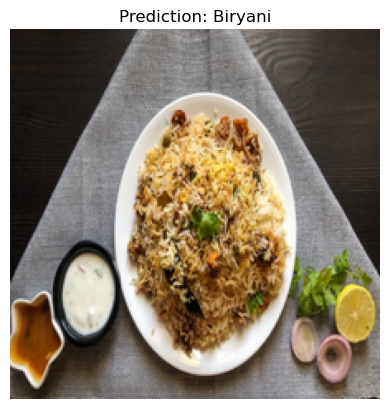

Predicted Food : Biryani
Confidence     : 98.36%


'Biryani'

In [49]:
image_path = str(list(biryani_folder.glob("*"))[0])

print(image_path)

predict_food(image_path)

Actual Class : Aloo_matar


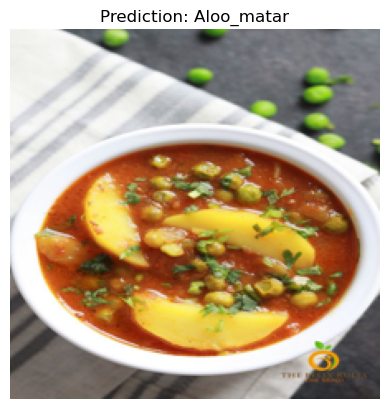

Predicted Food : Aloo_matar
Confidence     : 93.88%

Actual Class : Kadai_paneer


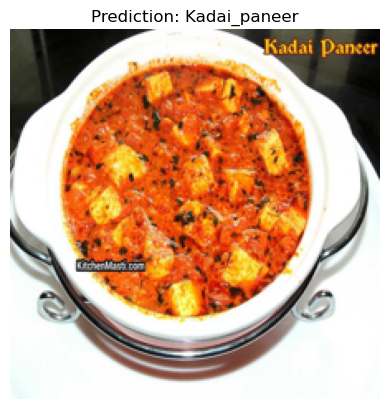

Predicted Food : Kadai_paneer
Confidence     : 89.78%

Actual Class : Paani_puri


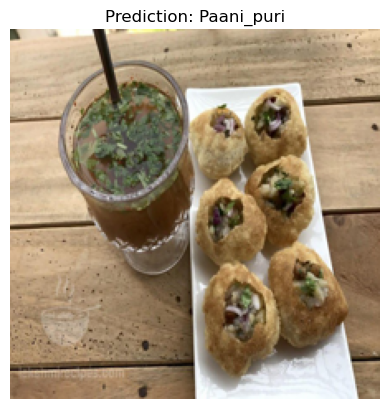

Predicted Food : Paani_puri
Confidence     : 45.34%

Actual Class : Biryani


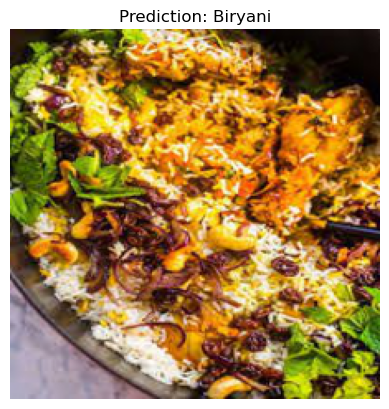

Predicted Food : Biryani
Confidence     : 99.58%

Actual Class : Besan_cheela


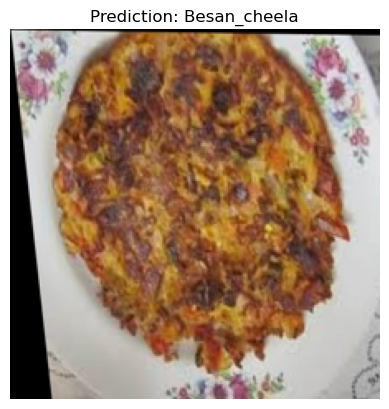

Predicted Food : Besan_cheela
Confidence     : 79.23%



In [51]:
import random

weak_classes = [
    "Aloo_matar",
    "Kadai_paneer",
    "Paani_puri",
    "Biryani",
    "Besan_cheela"
]

for food in weak_classes:

    print("="*60)

    folder = dataset_path / food

    image_path = str(random.choice(list(folder.glob("*"))))

    print("Actual Class :", food)

    predict_food(image_path)

    print()


Image 1
Actual : Aloo_matar


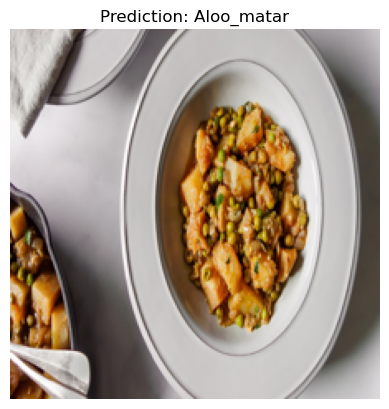

Predicted Food : Aloo_matar
Confidence     : 95.88%

Image 2
Actual : Aloo_matar


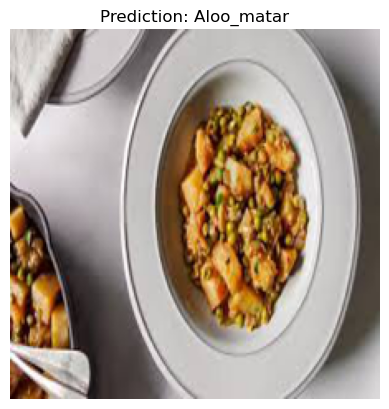

Predicted Food : Aloo_matar
Confidence     : 97.79%

Image 3
Actual : Aloo_matar


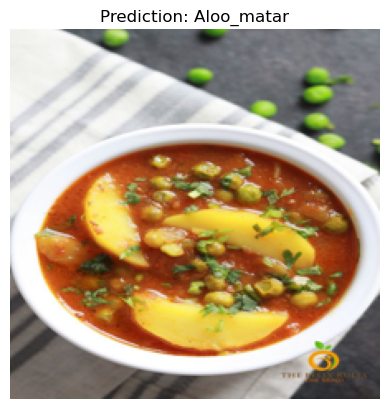

Predicted Food : Aloo_matar
Confidence     : 93.88%

Image 4
Actual : Aloo_matar


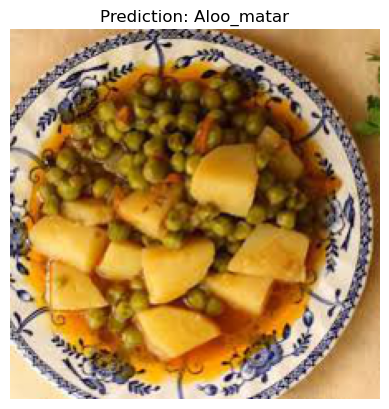

Predicted Food : Aloo_matar
Confidence     : 98.40%

Image 5
Actual : Aloo_matar


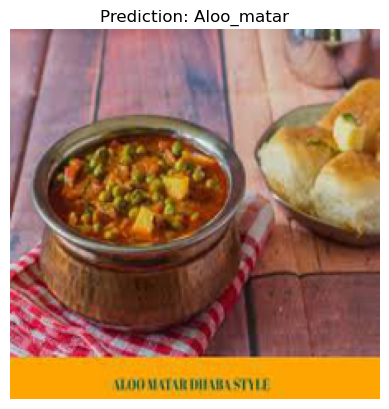

Predicted Food : Aloo_matar
Confidence     : 64.47%


In [52]:
import random

food = "Aloo_matar"

folder = dataset_path / food

images = random.sample(list(folder.glob("*")), 5)

for i, image_path in enumerate(images, 1):

    print(f"\nImage {i}")

    print("Actual :", food)

    predict_food(str(image_path))


Image 1
Actual : Paani_puri


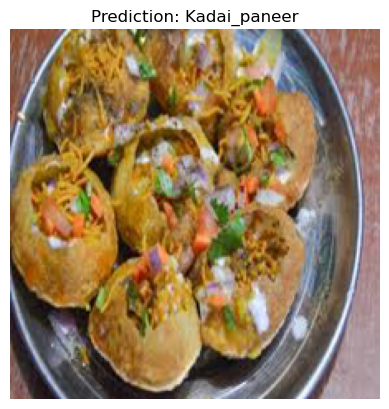

Predicted Food : Kadai_paneer
Confidence     : 73.16%

Image 2
Actual : Paani_puri


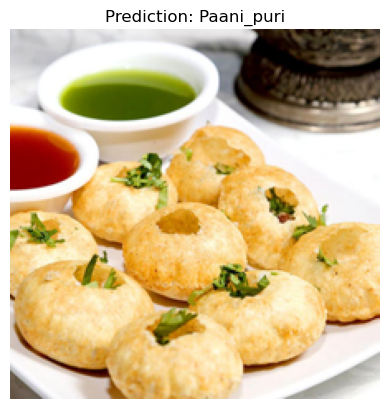

Predicted Food : Paani_puri
Confidence     : 81.85%

Image 3
Actual : Paani_puri


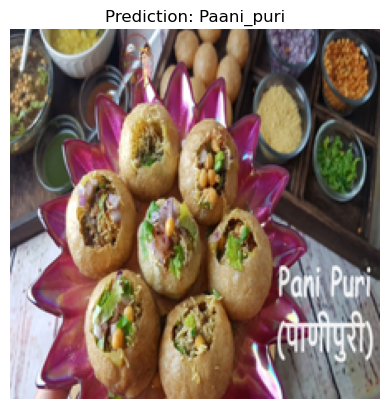

Predicted Food : Paani_puri
Confidence     : 97.74%

Image 4
Actual : Paani_puri


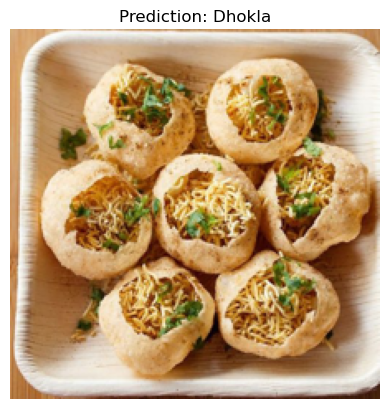

Predicted Food : Dhokla
Confidence     : 58.08%

Image 5
Actual : Paani_puri


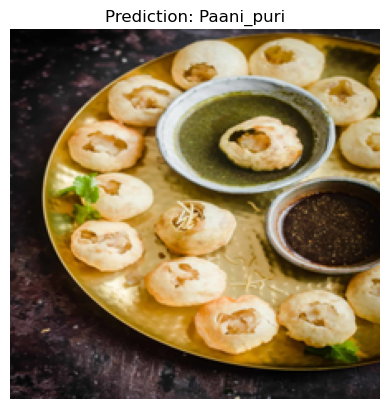

Predicted Food : Paani_puri
Confidence     : 95.91%


In [55]:
import random

food = "Paani_puri"

folder = dataset_path / food

images = random.sample(list(folder.glob("*")), 5)

for i, image_path in enumerate(images, 1):

    print(f"\nImage {i}")
    print("Actual :", food)

    predict_food(str(image_path))

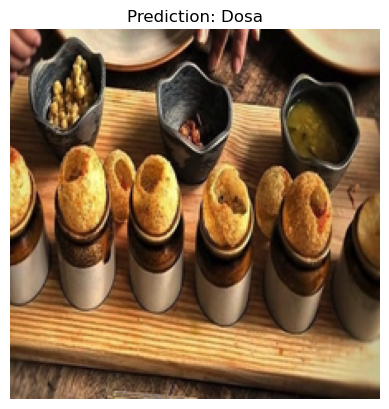

Predicted Food : Dosa
Confidence     : 95.80%


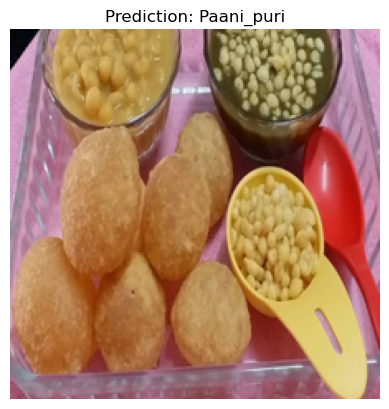

Predicted Food : Paani_puri
Confidence     : 99.13%


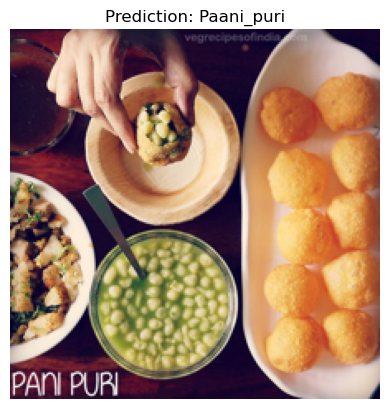

Predicted Food : Paani_puri
Confidence     : 96.69%


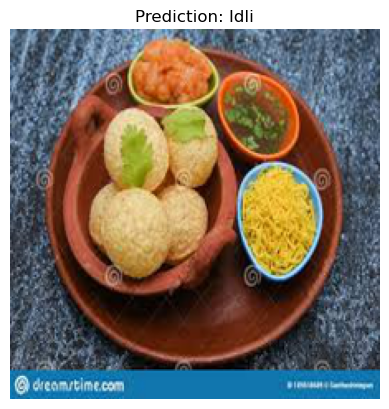

Predicted Food : Idli
Confidence     : 47.20%


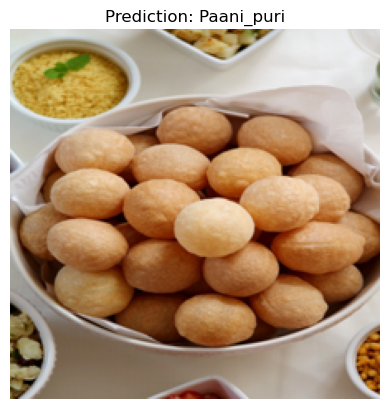

Predicted Food : Paani_puri
Confidence     : 90.23%


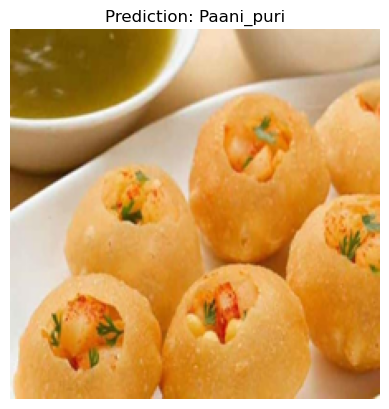

Predicted Food : Paani_puri
Confidence     : 99.38%


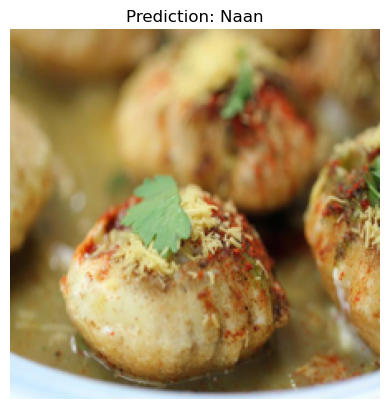

Predicted Food : Naan
Confidence     : 40.73%


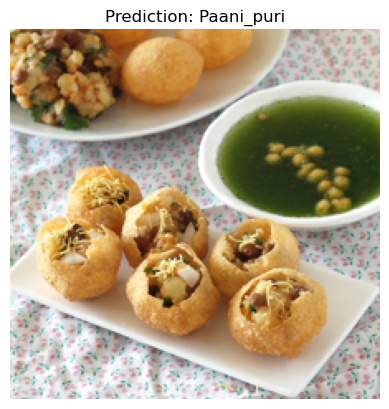

Predicted Food : Paani_puri
Confidence     : 99.17%


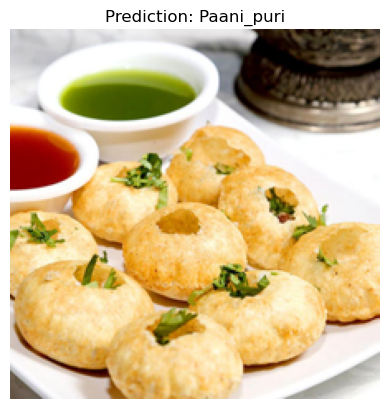

Predicted Food : Paani_puri
Confidence     : 81.85%


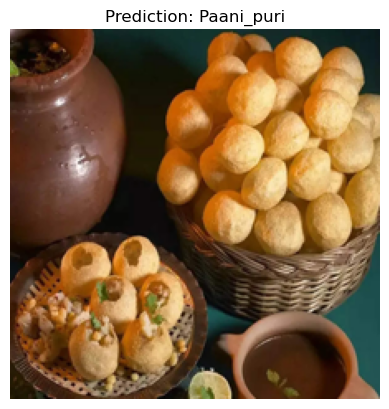

Predicted Food : Paani_puri
Confidence     : 98.93%


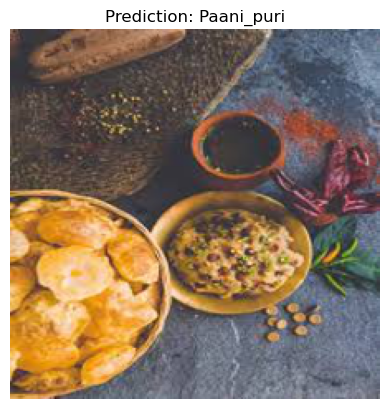

Predicted Food : Paani_puri
Confidence     : 57.73%


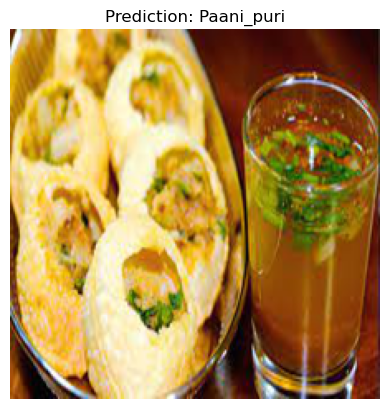

Predicted Food : Paani_puri
Confidence     : 79.10%


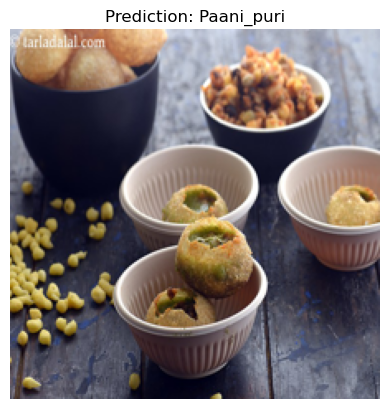

Predicted Food : Paani_puri
Confidence     : 91.81%


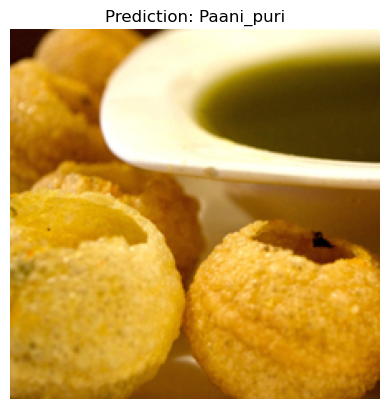

Predicted Food : Paani_puri
Confidence     : 83.40%


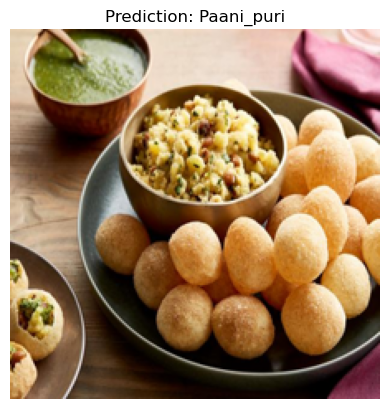

Predicted Food : Paani_puri
Confidence     : 98.49%


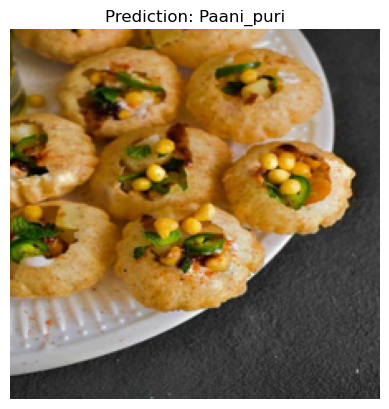

Predicted Food : Paani_puri
Confidence     : 99.48%


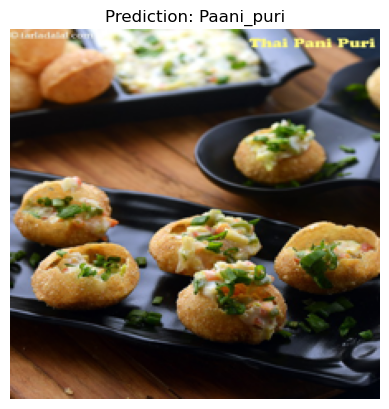

Predicted Food : Paani_puri
Confidence     : 60.37%


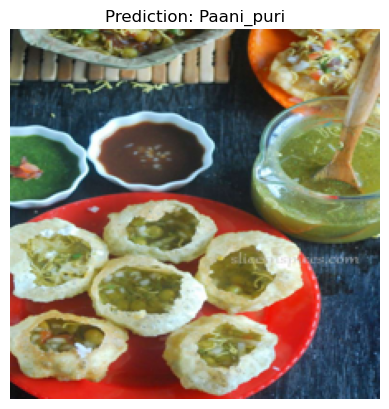

Predicted Food : Paani_puri
Confidence     : 90.09%


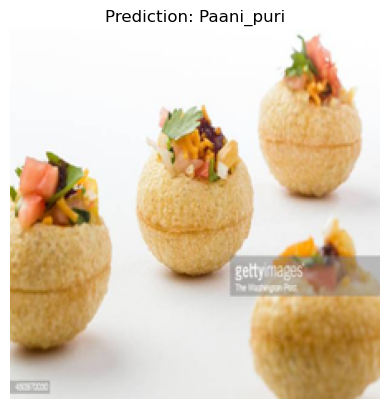

Predicted Food : Paani_puri
Confidence     : 61.33%


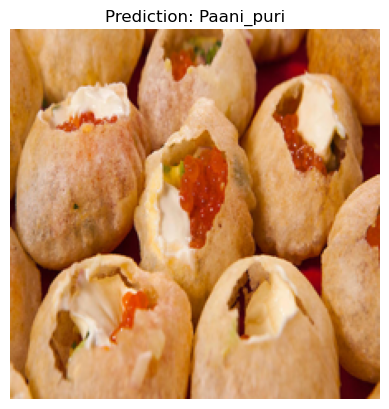

Predicted Food : Paani_puri
Confidence     : 87.51%


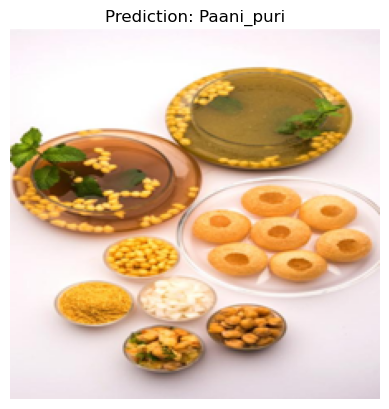

Predicted Food : Paani_puri
Confidence     : 99.77%


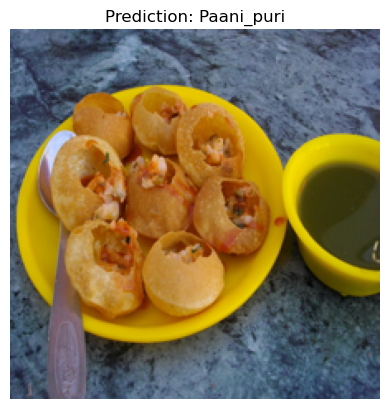

Predicted Food : Paani_puri
Confidence     : 89.69%


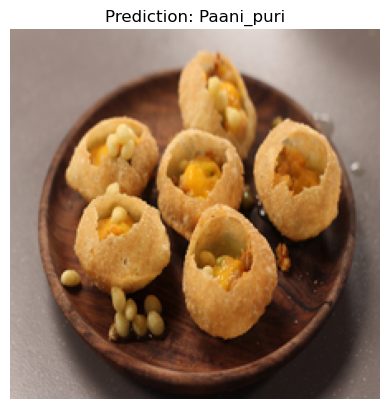

Predicted Food : Paani_puri
Confidence     : 99.76%


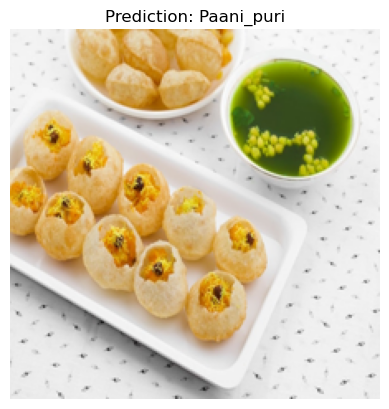

Predicted Food : Paani_puri
Confidence     : 97.64%


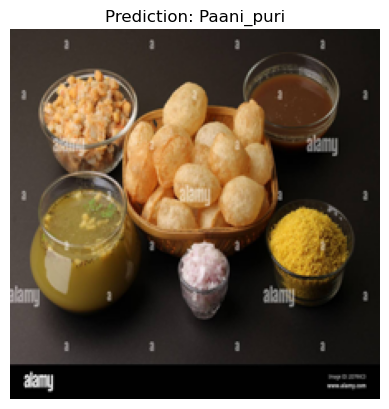

Predicted Food : Paani_puri
Confidence     : 83.79%


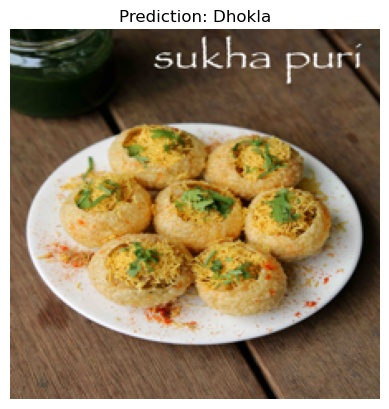

Predicted Food : Dhokla
Confidence     : 43.22%


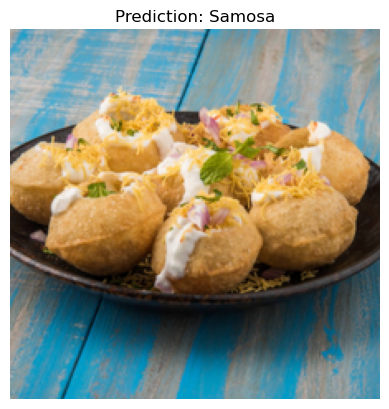

Predicted Food : Samosa
Confidence     : 28.83%


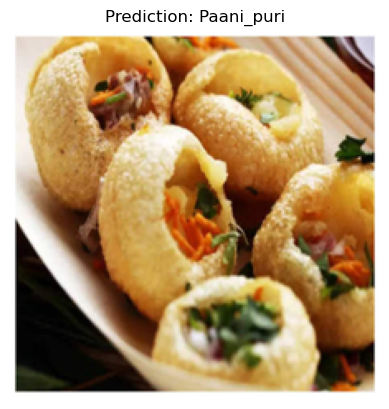

Predicted Food : Paani_puri
Confidence     : 95.92%


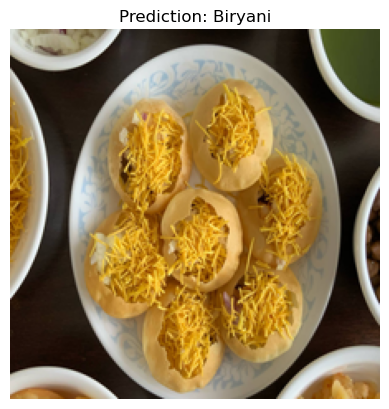

Predicted Food : Biryani
Confidence     : 88.72%


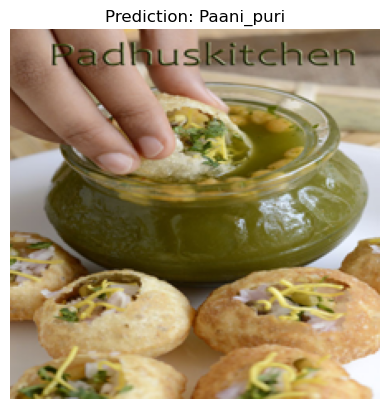

Predicted Food : Paani_puri
Confidence     : 96.49%


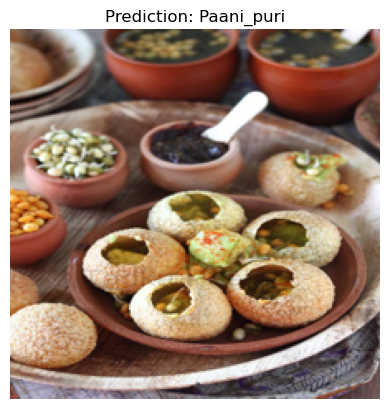

Predicted Food : Paani_puri
Confidence     : 98.00%


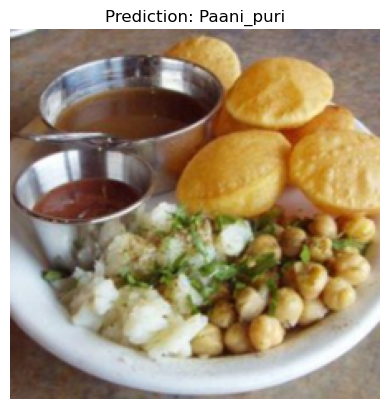

Predicted Food : Paani_puri
Confidence     : 60.18%


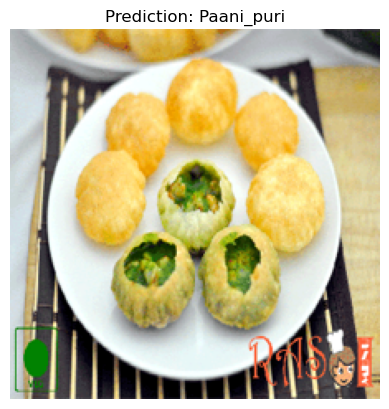

Predicted Food : Paani_puri
Confidence     : 97.01%


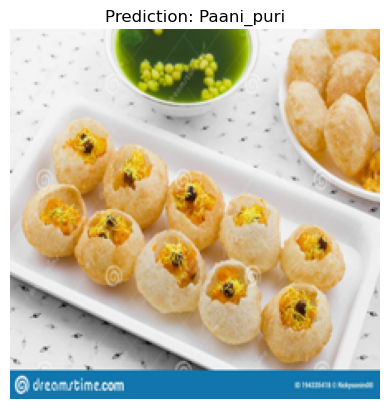

Predicted Food : Paani_puri
Confidence     : 96.96%


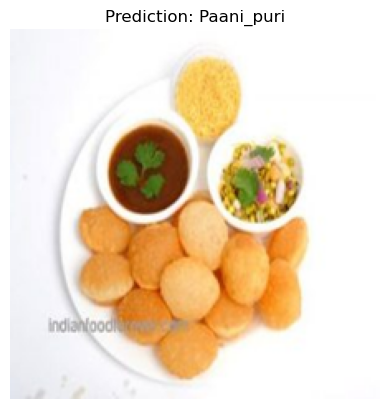

Predicted Food : Paani_puri
Confidence     : 56.81%


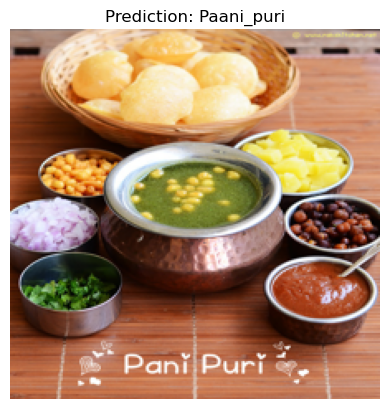

Predicted Food : Paani_puri
Confidence     : 68.97%


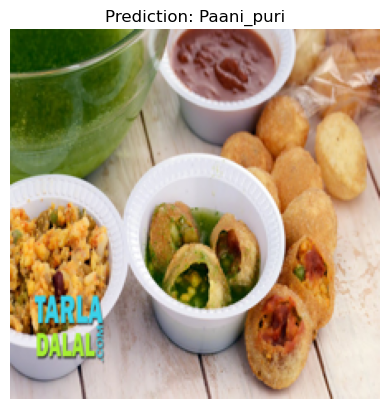

Predicted Food : Paani_puri
Confidence     : 52.28%


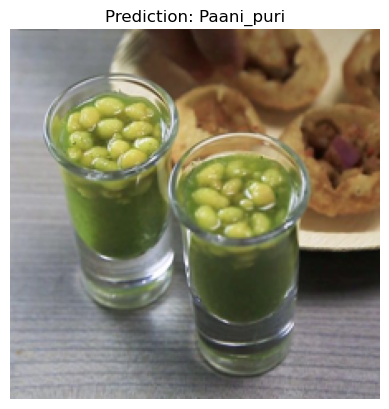

Predicted Food : Paani_puri
Confidence     : 99.89%


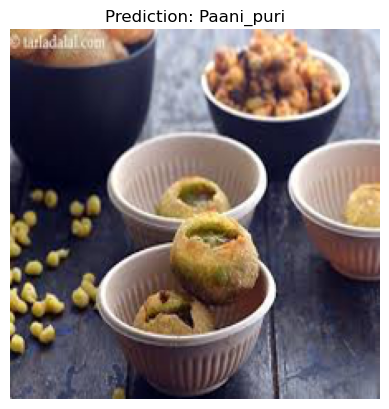

Predicted Food : Paani_puri
Confidence     : 90.59%


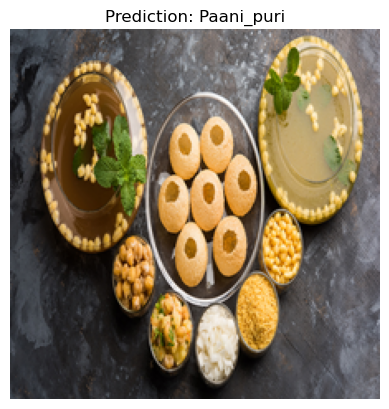

Predicted Food : Paani_puri
Confidence     : 99.70%


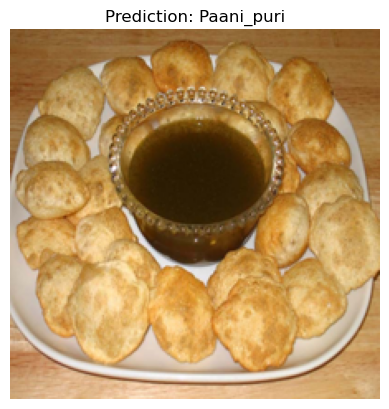

Predicted Food : Paani_puri
Confidence     : 96.57%


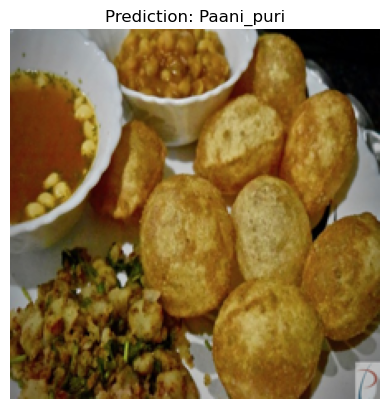

Predicted Food : Paani_puri
Confidence     : 92.46%


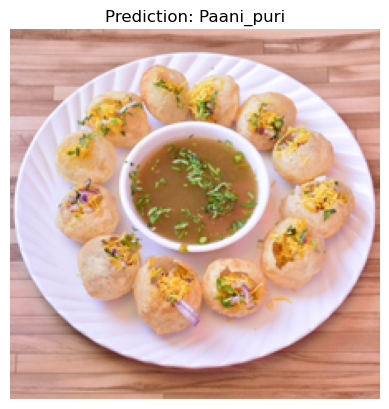

Predicted Food : Paani_puri
Confidence     : 54.03%


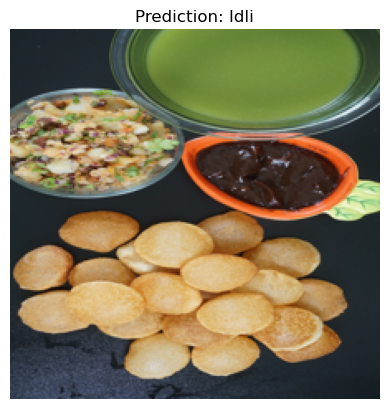

Predicted Food : Idli
Confidence     : 51.54%


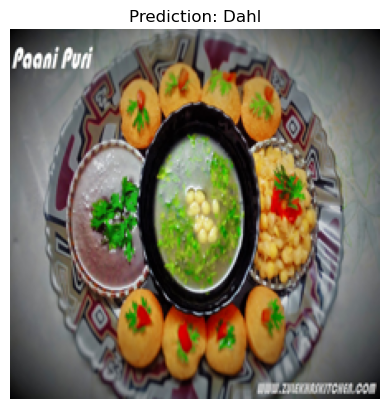

Predicted Food : Dahl
Confidence     : 85.38%


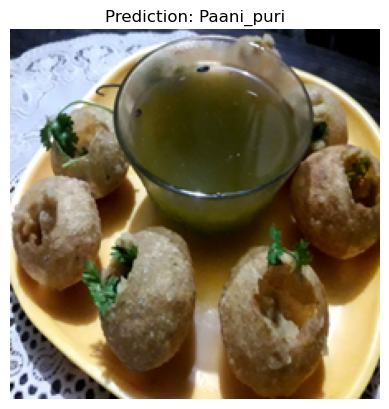

Predicted Food : Paani_puri
Confidence     : 98.58%


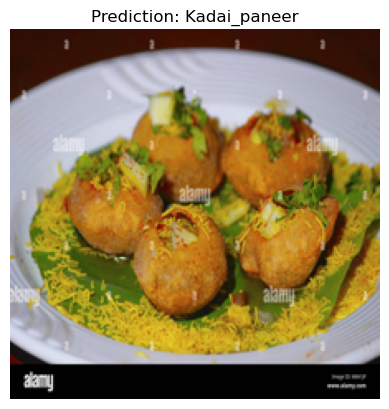

Predicted Food : Kadai_paneer
Confidence     : 96.07%

Correct: 38/47
Accuracy: 80.85%


In [56]:
correct = 0
total = 0

for img_path, label in zip(X_test, y_test):

    if label == "Paani_puri":

        prediction = predict_food(str(img_path))

        total += 1

        if prediction == "Paani_puri":
            correct += 1

print(f"\nCorrect: {correct}/{total}")
print(f"Accuracy: {(correct/total)*100:.2f}%")